In [1]:
import torch
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from modeling.models.bethge import BethgeModel
from modeling.train_utils import array_to_dataloader
from scipy.stats import spearmanr
from sklearn.cluster import KMeans
from torchvision import transforms
from scipy import optimize
import os
import cv2

def gaussian(height, center_x, center_y, width_x, width_y):
    """Returns a gaussian function with the given parameters"""
    width_x = float(width_x)
    width_y = float(width_y)
    return lambda x,y: height*np.exp(
                -(((center_x-x)/width_x)**2+((center_y-y)/width_y)**2)/2)

def moments(data):
    """Returns (height, x, y, width_x, width_y)
    the gaussian parameters of a 2D distribution by calculating its
    moments """
    total = data.sum()
    X, Y = np.indices(data.shape)
    x = (X*data).sum()/total
    y = (Y*data).sum()/total
    col = data[:, int(y)]
    width_x = np.sqrt(np.abs((np.arange(col.size)-x)**2*col).sum()/col.sum())
    row = data[int(x), :]
    width_y = np.sqrt(np.abs((np.arange(row.size)-y)**2*row).sum()/row.sum())
    height = data.max()
    return height, x, y, width_x, width_y

def fitgaussian(data):
    """Returns (height, x, y, width_x, width_y)
    the gaussian parameters of a 2D distribution found by a fit"""
    params = moments(data)
    errorfunction = lambda p: np.ravel(gaussian(*p)(*np.indices(data.shape)) -
                                 data)
    p, success = optimize.leastsq(errorfunction, params)
    return p
def make_dir_try(dir):
    try:
        os.makedirs(dir, exist_ok=True)
        print("Directory '%s' created successfully" % dir)
    except OSError as error:
        print("Directory '%s' can not be created" % dir)

def process_spatial_w_avg(net):
    spatial_w = net.fc[0].bank[0].weight_spatial.data

    for i, w in enumerate(spatial_w):
        sum = 0
        sum += torch.sum(w[:1,:])
        sum += torch.sum(w[:,20:])
        sum += torch.sum(w[20:,:])
        sum += torch.sum(w[:,:1])
        sum -= w[0,0]
        sum -= w[0,20]
        sum -= w[20,20]
        sum -= w[20,0]
        sum /= 80
        w[:1,:] = sum
        w[:,20:] = sum
        w[20:,:] = sum
        w[:,:1] = sum
        spatial_w[i] = w
    net.fc[0].bank[0].weight_spatial.data = spatial_w
    return net
def process_spatial_w(net):
    spatial_w = net.fc[0].bank[0].weight_spatial.data

    for i, w in enumerate(spatial_w):
        sum = 0
        w[:1,:] = sum
        w[:,20:] = sum
        w[20:,:] = sum
        w[:,:1] = sum
        spatial_w[i] = w
    net.fc[0].bank[0].weight_spatial.data = spatial_w
    return net
sites = ['m1s1','m1s2','m1s3','m2s1','m2s2','m3s1']

batch_size = 2048
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
channels = 256
num_layers = 9
input_size = 50
first_k = 9
later_k = 3
pool_size = 2
factorized = True
num_maps = 1

rc_test_img1 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blanktilt45.npy')
rc_test_img2 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blanktilt135.npy')
rc_test_img3 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blankvertical.npy')
rc_test_img4 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blankHorizontal.npy')
rc_test_img5 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blanktilt45_reverse.npy')
rc_test_img6 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blankHorizontal_reverse.npy')
rc_test_img7 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blanktilt135_reverse.npy')
rc_test_img8 = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/bar_img_matrix/img_matrix_blankvertical_reverse.npy')

rc_imgs = np.stack([rc_test_img1,rc_test_img2,rc_test_img3,rc_test_img4,rc_test_img5,rc_test_img6,rc_test_img7,rc_test_img8])
rc_imgs = np.reshape(rc_imgs, (rc_imgs.shape[0],input_size,input_size,rc_imgs.shape[2],rc_imgs.shape[3],rc_imgs.shape[4]))

In [2]:
sites = ['m1s1', 'm1s2', 'm1s3', 'm2s1', 'm2s2', 'm3s1']
sites = ['m2s1']

In [5]:
all_width_x = []
all_width_y = []
all_rsp_matrix = []
for site in sites:
    directory_base = 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_nomod_moretrain/'+site+'/'
    make_dir_try(directory_base)
    val_x =np.load('A:/school/College_Junior/research/CNN_Tang_project/data/Processed_Tang_data/all_sites_data_prepared/pics_data/val_img_'+site+'.npy')
    val_y = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/Processed_Tang_data/all_sites_data_prepared/New_response_data/valRsp_'+site+'.npy')
    num_neurons = val_y.shape[1]

    net = BethgeModel(channels=channels, num_layers=num_layers, input_size=input_size,
                      output_size=num_neurons, first_k=first_k, later_k=later_k,
                      input_channels=1, pool_size=pool_size, factorized=True,
                      num_maps=num_maps).cuda()

    net.to(device)
    net.load_state_dict(torch.load('A:/school/College_Junior/research/CNN_Tang_project/saved_models/complexity_test/C_256_L_9_model_shared_core'))
    # TODO:only experimental
    net = process_spatial_w_avg(net)
    bar_wid=1
    bar_len = 1
    rsp_matrix = np.zeros((rc_imgs.shape[0],num_neurons,50,50))
    for img_set, imgs in enumerate(rc_imgs):
        for i in tqdm(range(input_size)):
            for j in range(input_size):
                img = np.reshape(imgs[i,j],(1,1,50,50))
                input = torch.FloatTensor(img).to(device)
                rsp = net(input).detach().cpu().numpy()
                a=np.zeros((50,50))
                for neuron in range(num_neurons):
                    rsp_matrix[img_set,neuron,i,j] = rsp[:,neuron]
    rsp_matrix_sum = np.max(rsp_matrix,axis=0)
    all_rsp_matrix.append(rsp_matrix)
    x_widths = np.zeros(num_neurons)
    y_widths = np.zeros(num_neurons)
    for neuron in range(num_neurons):
        data = rsp_matrix_sum[neuron]
        plt.figure(neuron)
        plt.jet()

        plt.matshow(data)
        data -= data.min()
        data /= (data.max() - data.min())
        data = np.abs(cv2.resize(data, (50, 50)))
        plt.colorbar()

        params = fitgaussian(data)
        fit = gaussian(*params)

        ct_data = np.indices(data.shape)
        ct_z = fit(*ct_data)
        plt.contour(ct_z,linewidths=0.5,colors='k')
        ax = plt.gca()
        (height, x, y, width_x, width_y) = params

        plt.text(0.95, 0.05, """
        x : %.1f
        y : %.1f
        width_x : %.1f
        width_y : %.1f""" %(x, y, width_x, width_y),
                fontsize=16, horizontalalignment='right',
                verticalalignment='bottom', transform=ax.transAxes)
        directory = directory_base+str(neuron)+'.jpg'
        plt.savefig(directory)
        plt.close()
        x_widths[neuron] = width_x
        y_widths[neuron] = width_y
    all_width_x.append(x_widths)
    all_width_y.append(y_widths)

  0%|          | 0/50 [00:00<?, ?it/s]

Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_nomod_moretrain/m2s1/' created successfully


100%|██████████| 50/50 [00:06<00:00,  8.27it/s]
<ipython-input-5-261369900a91>:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(data)
<ipython-input-5-261369900a91>:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(neuron)


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [3]:
#only for testing
rsp_all = all_rsp_matrix[0]
rsp_matrix_max = np.max(rsp_all,axis=0)

In [12]:
all_width_x_w = []
all_width_y_w = []

for site in sites:
    directory_base = 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/'+site+'/'
    make_dir_try(directory_base)
    val_x =np.load('A:/school/College_Junior/research/CNN_Tang_project/data/Processed_Tang_data/all_sites_data_prepared/pics_data/val_img_'+site+'.npy')
    val_y = np.load('A:/school/College_Junior/research/CNN_Tang_project/data/Processed_Tang_data/all_sites_data_prepared/New_response_data/valRsp_'+site+'.npy')
    num_neurons = val_y.shape[1]

    net = BethgeModel(channels=channels, num_layers=num_layers, input_size=input_size,
                      output_size=num_neurons, first_k=first_k, later_k=later_k,
                      input_channels=1, pool_size=pool_size, factorized=True,
                      num_maps=num_maps).cuda()

    net.to(device)
    net.load_state_dict(torch.load('A:/school/College_Junior/research/CNN_Tang_project/saved_models/Sample_size_test_models/9_10_'+site+'_shared_core_256_9'))
    net = process_spatial_w_avg(net)
    fc_layer = net.fc[0].bank[0]
    spatial_w = fc_layer.weight_spatial.data
    spatial_w_np = spatial_w.detach().cpu().numpy()
    x_widths = np.zeros(num_neurons)
    y_widths = np.zeros(num_neurons)
    for neuron in range(num_neurons):
        data = spatial_w_np[neuron]
        # plt.figure(neuron)
        # plt.jet()
        data = np.abs(cv2.resize(data, (50, 50)))
        # plt.matshow(data)
        data -= data.min()
        data /= (data.max() - data.min())

        # plt.colorbar()

        params = fitgaussian(data)
        fit = gaussian(*params)

        ct_data = np.indices(data.shape)
        ct_z = fit(*ct_data)
        # plt.contour(ct_z,linewidths=0.5,colors='k')
        # ax = plt.gca()
        (height, x, y, width_x, width_y) = params

        # plt.text(0.95, 0.05, """
        # x : %.1f
        # y : %.1f
        # width_x : %.1f
        # width_y : %.1f""" %(x, y, width_x, width_y),
        #         fontsize=16, horizontalalignment='right',
        #         verticalalignment='bottom', transform=ax.transAxes)
        # directory = directory_base+str(neuron)+'.jpg'
        # plt.savefig(directory)
        x_widths[neuron] = width_x
        y_widths[neuron] = width_y
    all_width_x_w.append(x_widths)
    all_width_y_w.append(y_widths)

Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m1s1/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m1s2/' created successfully


A:\software\anaconda\lib\site-packages\scipy\optimize\minpack.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 1200.
  warnings.warn(errors[info][0], RuntimeWarning)


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m1s3/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m2s1/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m2s2/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_imgs/m3s1/' created successfully


In [13]:
for i, site in enumerate(sites):
    plt.figure()
    plt.xlim(0,10)
    plt.ylim(0,10)
    plt.plot(all_width_x[i],all_width_x_w[i],'go')
    plt.savefig('x_width'+site)
    plt.figure()
    plt.xlim(0,10)
    plt.ylim(0,10)
    plt.plot(all_width_y[i],all_width_y_w[i],'go')
    plt.savefig('y_width'+site)
    np.save('width_x_'+site,all_width_x[i])
    np.save('width_y_'+site,all_width_y[i])
    #%%

  0%|          | 0/5 [00:00<?, ?it/s]

Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_nomod_moretrain/m2s1/' created successfully


100%|██████████| 5/5 [00:00<00:00,  6.74it/s]


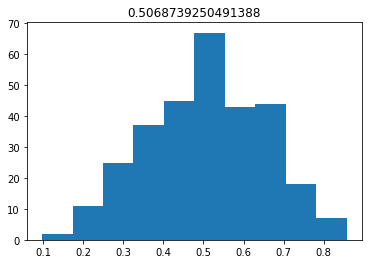

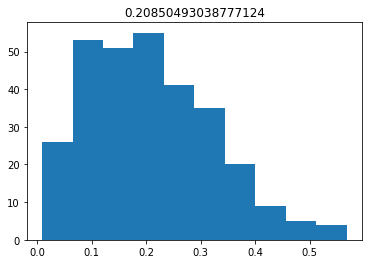

In [7]:
plt.ioff()
for site in sites:
    directory_base = 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/receptive_field_nomod_moretrain/'+site+'/'
    make_dir_try(directory_base)
    nb_validation_samples = 1000
    nb_training_samples = 49000
    val_x = np.load('../data/Processed_Tang_data/all_sites_data_prepared/pics_data/val_img_'+site+'.npy')
    val_y = np.load('../data/Processed_Tang_data/all_sites_data_prepared/New_response_data/valRsp_'+site+'.npy')
    val_x =  np.transpose(val_x, (0, 3, 1, 2))
    batch_size = 2048
    num_neurons = val_y.shape[1]

    val_loader = array_to_dataloader(val_x, val_y, batch_size=200)

    with torch.no_grad():
        net = BethgeModel(channels=channels, num_layers=num_layers, input_size=input_size,
                      output_size=num_neurons, first_k=first_k, later_k=later_k,
                      input_channels=1, pool_size=pool_size, factorized=True,
                      num_maps=num_maps).cuda()

        net.to(device)
        net.load_state_dict(torch.load('A:/school/College_Junior/research/CNN_Tang_project/saved_models/complexity_test/C_256_L_9_model_shared_core'))
        net.eval()
        prediction = []
        actual = []
        for batch_num, (x, y) in enumerate(tqdm(val_loader)):
            x, y = x.to(device), y.to(device)
            outputs = net(x).cpu().numpy()
            prediction.extend(outputs)
            actual.extend(y.cpu().numpy())

        prediction = np.stack(prediction)
        actual = np.stack(actual)
        R = np.zeros(num_neurons)
        VE = np.zeros(num_neurons)
        SR = np.zeros(num_neurons)
        MAE = np.zeros(num_neurons)
        for neuron in (range(num_neurons)):
            # vis_img = plt.imread("corr+mae/" + str(neuron) + '.jpg')
            # vis_img = torch.reshape(torch.tensor(vis_img).type(torch.FloatTensor), (1, 1, 50, 50)).to(device)
            # vis_img -= vis_img.min()
            # vis_img /= (vis_img.max() - vis_img.min())
            # vis_rsp = net(vis_img).cpu().numpy()


            pred1 = prediction[:, neuron]
            val_y = actual[:, neuron]
            mae = np.sum(np.abs(pred1 - val_y))
            MAE[neuron] = mae
            y_arg = np.argsort(val_y)

            u2 = np.zeros((2, nb_validation_samples))
            u2[0, :] = np.reshape(pred1, (nb_validation_samples))
            u2[1, :] = np.reshape(val_y, (nb_validation_samples))

            c2 = np.corrcoef(u2)
            R[neuron] = c2[0, 1]
            SR[neuron] = spearmanr(pred1, val_y)[0]
            VE[neuron] = 1 - np.var(pred1 - val_y) / np.var(val_y)


            # plt.figure(neuron)
            # plt.plot(pred1[y_arg], label='pred')
            # plt.plot(np.sort(val_y), label='actual')
            # #plt.axhline(y=vis_rsp[:,neuron].item(), color='r', linestyle='-')
            # plt.title(str(R[neuron])+'_'+str(VE[neuron]))
            # plt.legend()
            # plt.savefig(directory_base + str(neuron) )
            # plt.close()

        #selected_idx_SR = np.argsort(SR)[::-1]
        #np.save('selected_idx_SR', selected_idx_SR)
        # print(R)
        # print(np.mean(SR))
        # print(np.mean(R))
        # print(np.mean(VE))
        # print(np.mean(MAE))
        plt.hist(R)
        plt.title(str(np.mean(R)))
        plt.savefig(directory_base+'Ro')
        plt.show()
        plt.hist(VE)
        plt.title(str(np.mean(VE)))
        plt.savefig(directory_base+'VEo')
        plt.show()

In [15]:
from scripts.visualize_SharedCore import visualize_neuron
sites = ['m1s1', 'm1s2', 'm1s3', 'm2s1', 'm2s2', 'm3s1']
for site in sites:
    directory_base = 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/'+site+'/'
    make_dir_try(directory_base)
    val_y = np.load('../data/Processed_Tang_data/all_sites_data_prepared/New_response_data/valRsp_'+site+'.npy')
    num_neurons = val_y.shape[1]
    net = BethgeModel(channels=channels, num_layers=num_layers, input_size=input_size,
                      output_size=num_neurons, first_k=first_k, later_k=later_k,
                      input_channels=1, pool_size=pool_size, factorized=True,
                      num_maps=num_maps).cuda()

    net.to(device)
    net.load_state_dict(torch.load('A:/school/College_Junior/research/CNN_Tang_project/saved_models/Sample_size_test_models/9_10_'+site+'_shared_core_256_9'))
    net = process_spatial_w(net)
    net.eval()
    for neuron in range(20):
        directory = directory_base
        visualize_neuron(neuron, input_size, [net], directory, save=True)

Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m1s1/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m1s2/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m1s3/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m2s1/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m2s2/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Visualization/adjust_rc_avg/m3s1/' created successfully
BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


Lossy conversion from float32 to uint8. Range [0.0, 256.0]. Convert image to uint8 prior to saving to suppress this warning.


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m1s1/' created successfully


<ipython-input-16-61c09e13e2d5>:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.matshow(data)


Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m1s2/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m1s3/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m2s1/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m2s2/' created successfully
Directory 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/m3s1/' created successfully


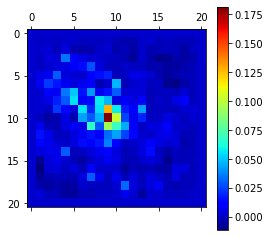

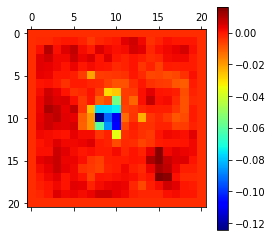

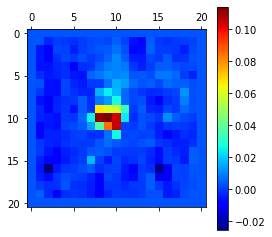

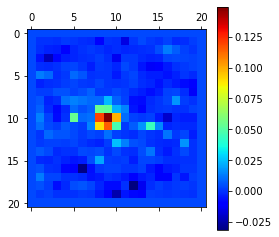

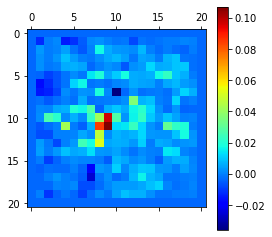

...

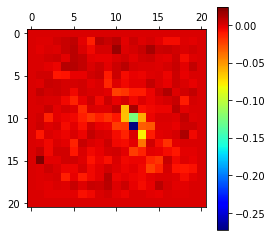

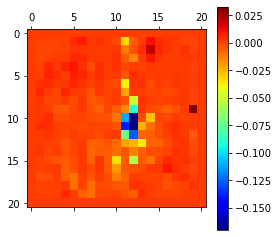

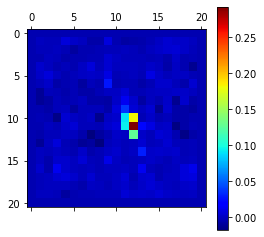

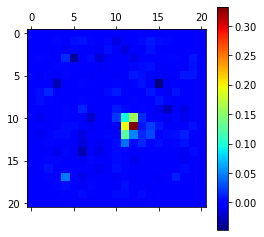

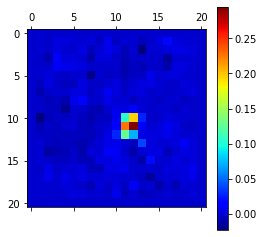

<Figure size 432x288 with 0 Axes>

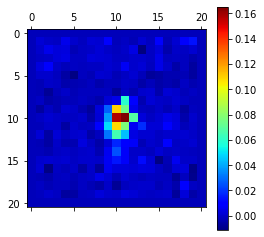

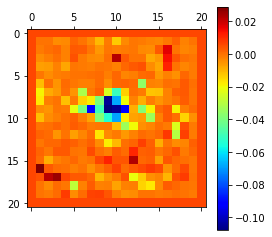

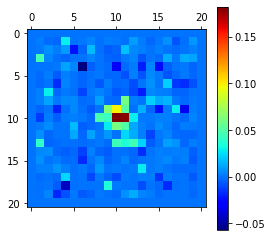

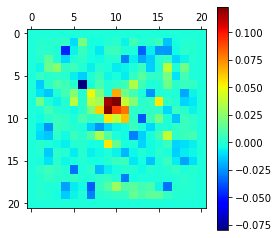

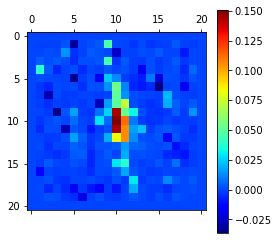

...

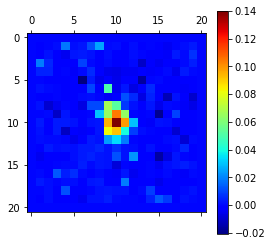

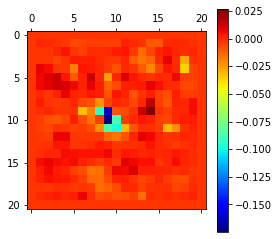

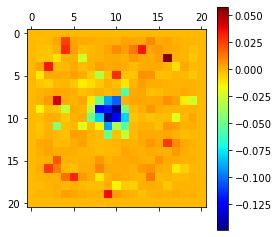

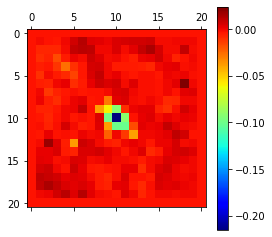

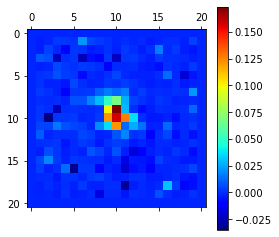

In [16]:
sites = ['m1s1', 'm1s2', 'm1s3', 'm2s1', 'm2s2', 'm3s1']
for site in sites:
    directory_base = 'A:/school/College_Junior/research/CNN_Tang_project/analysis/Graphs/spatial_weight_avg/'+site+'/'
    make_dir_try(directory_base)
    val_y = np.load('../data/Processed_Tang_data/all_sites_data_prepared/New_response_data/valRsp_'+site+'.npy')
    num_neurons = val_y.shape[1]
    net = BethgeModel(channels=channels, num_layers=num_layers, input_size=input_size,
                      output_size=num_neurons, first_k=first_k, later_k=later_k,
                      input_channels=1, pool_size=pool_size, factorized=True,
                      num_maps=num_maps).cuda()

    net.to(device)
    net.load_state_dict(torch.load('A:/school/College_Junior/research/CNN_Tang_project/saved_models/Sample_size_test_models/9_10_'+site+'_shared_core_256_9'))
    net = process_spatial_w(net)
    fc_layer = net.fc[0].bank[0]
    spatial_w = fc_layer.weight_spatial.data
    spatial_w_np = spatial_w.detach().cpu().numpy()
    for neuron in range(num_neurons):
        data = spatial_w_np[neuron]
        plt.figure(neuron)

        plt.jet()
        plt.matshow(data)
        plt.colorbar()

        directory = directory_base+str(neuron)+'.jpg'
        plt.savefig(directory)